In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as colors
from miniscope.imagingIO import loopMice, loadData, loadBeh, getBeh
from miniscope.analysis import dffCalc, filtData, smoothData, normData
from miniscope.events import getEvents
from miniscope.trials import markTrials
from miniscope.bouts import getBouts, getBoutDur, getBouts_
from miniscope.statistics import stdCalc, getBoutMeans, getStats, getBoutMeans_
from miniscope.plotter import plotMean, plotHeat, plotTrials

In [2]:
# Start gathering the data from FR1 experiment
# Mouse IDs and dataset IDs
mice = [(8404, 6), (8857, 3), (8864, 1)]
# Parameters
# Behavior type
behType = 'FR1'
# Imaging frame rate
fs = 0.05
# Which trials to include
trials=[1,12]
# Do you want to save?
save = False

In [3]:
# Get file paths for imaging data and behavior timestamps
fileList = loopMice(mice, behType)

# Load the imaging data
dataList = loadData(mice, behType)

# Load the behaviour timestamps
eventList = getBeh(mice, fileList['Behaviour'], behType)

# dFF and plot again
filtList = filtData(mice, dffCalc(mice, dataList, lowest=False), cutoff=5.0, order=6)
dFFList = smoothData(mice, filtList, window=4)

# Normalize the data
normList = normData(mice, dFFList)

In [4]:
# Pick the event
eventType = 'Eat_Start'
base = -10.0
duration = 30.0

# Find the marked events
eventsData = markTrials(mice, dFFList, base=base, duration=duration, eventType=eventType, behType=behType, trials=trials, baselining=True)


3  mice were loaded.
Mouse number 8404  had  15  total rewards.
Mouse number 8857  had  17  total rewards.
Mouse number 8864  had  13  total rewards.


In [6]:
def giveColors(n):
    cmap = plt.cm.get_cmap('rainbow', n)    # PiYG
    
    colorList = []                 
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colorList.append(colors.rgb2hex(rgb))
        
    return colorList[0:n]

colorList=giveColors(12)
#colorList=colorList.reverse()

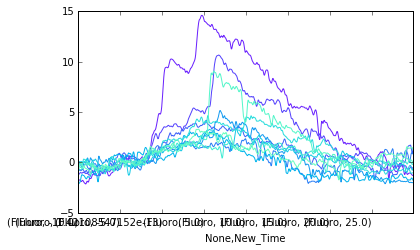

In [7]:
def plotCell(cellTag):
    cellNames = eventsData['Cell'].drop_duplicates().values
    cell = cellNames[cellTag]
    for i in range(1,12):
        df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
        df.loc[cell,i].plot(legend=False, subplots=True, color=giveColors(25)[i])

# Which cell to plot
cellTag = 1
plotCell(cellTag)

C:\Anaconda2\lib\site-packages\matplotlib\pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


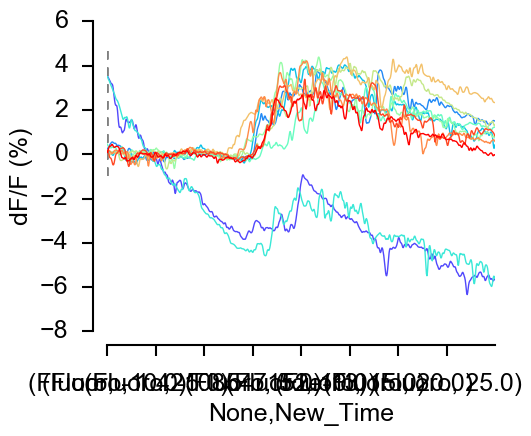

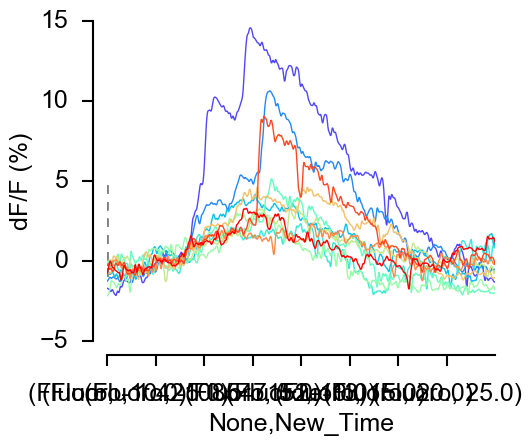

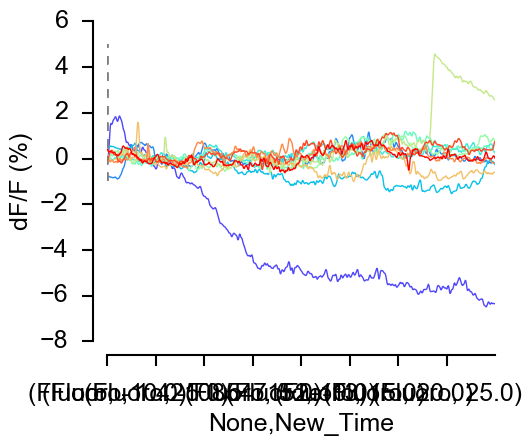

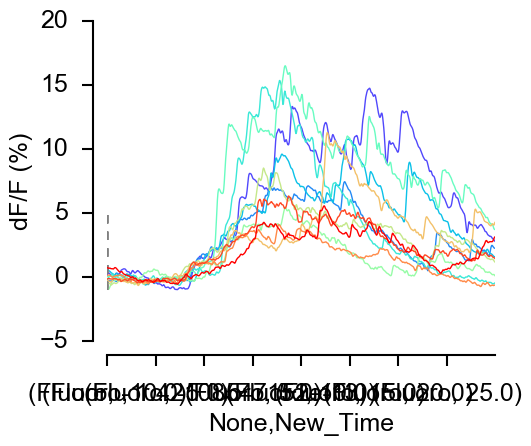

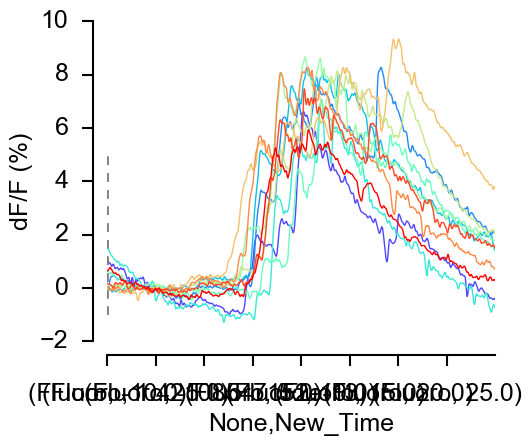

...

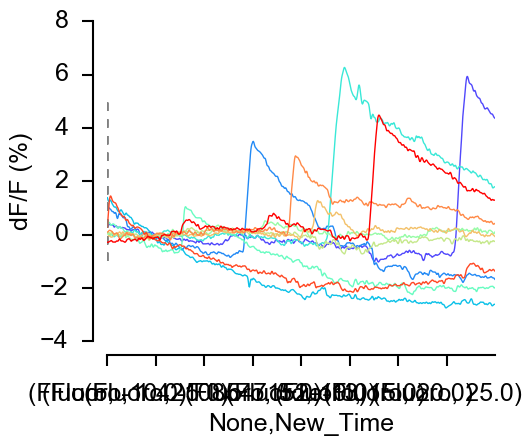

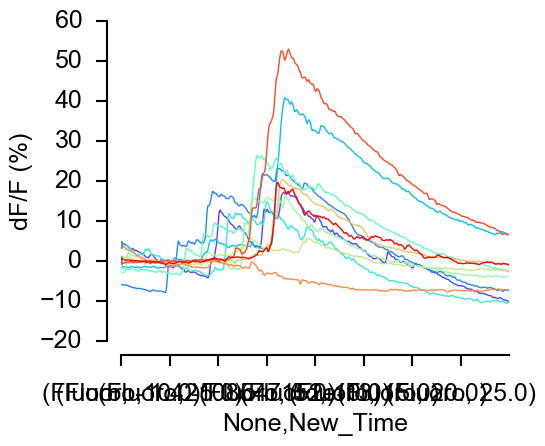

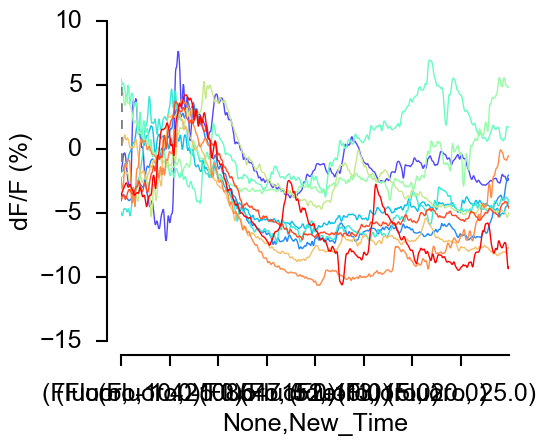

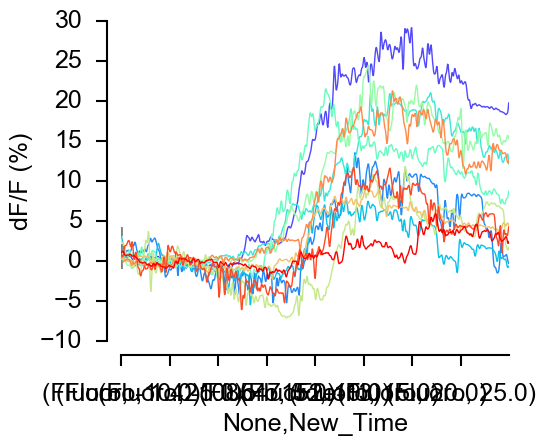

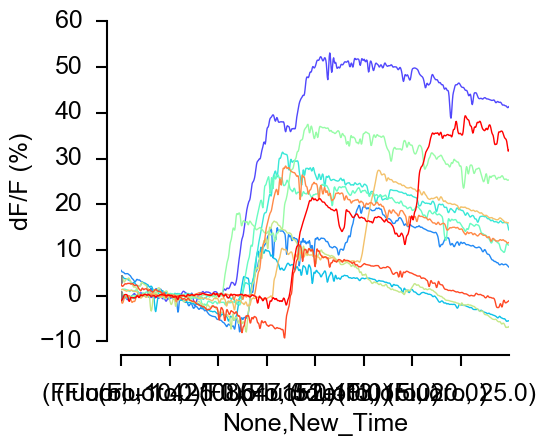

In [12]:
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(base,duration,fs)
for ind, cell in enumerate(cellNames):
    fig = plt.figure(figsize=(5,4), facecolor="w", dpi= 150)
    
    for i in range(1,12):
        plt.style.use('classic')
        # Set the font dictionaries (for plot title and axis titles)
        font = {'sans-serif' : 'Arial',
                'weight' : 'normal',
                'size'   : 18}
        plt.rc('font', **font)
        
        line = 1.5
        colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')
    
        ax = plt.subplot(111)
        
        ## labels
        ax.set_xlabel("Time (sec)")
        ax.set_ylabel("dF/F (%)")
        #ax.set_title("Aligned to event::Update the title", fontsize= 12)

        ## Remove top axes and right axes ticks
        ax.get_xaxis().tick_top()
        ax.get_yaxis().tick_left()
        
        ## Remove top axes and right axes ticks
        ax.get_xaxis().tick_top()
        ax.get_yaxis().tick_left()

        ## adjust the spines and ticks
        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.spines['left'].set_linewidth(line)
        ax.spines['left'].set_position(('outward', 10))
        ax.spines['bottom'].set_linewidth(line)
        ax.spines['bottom'].set_position(('outward', 10))
        ax.xaxis.set_ticks_position('bottom')
        ax.yaxis.set_ticks_position('left')

        ## decorate the axes
        ax.tick_params(axis='y', color= '#000000', width= line, direction='out', length= 8, which='major', pad=10)
        ax.tick_params(axis='x', color= '#000000', width= line, direction='out', length= 8, which='major', pad=12)
        
        ax.plot([0, 0],[-1, 5], 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
        
        df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
        df.loc[cell,i].plot(legend=False, subplots=True, color=colorList[i])
    fname = "J:\\Hakan Kucukdereli\\Miniscope_Behaviour_MPIN\\scripts\\figures\\first_draft\\all_cells\\plots\\5_plots_"+cell+"_"+eventType+".svg"
    if save:
        fig.savefig(fname)
        
if save:
    fig.savefig("J:\\Hakan Kucukdereli\\Miniscope_Behaviour_MPIN\\scripts\\figures\\first_draft\\all_cells\\5_eat_start_all_cells_plots_10sec.svg")
        

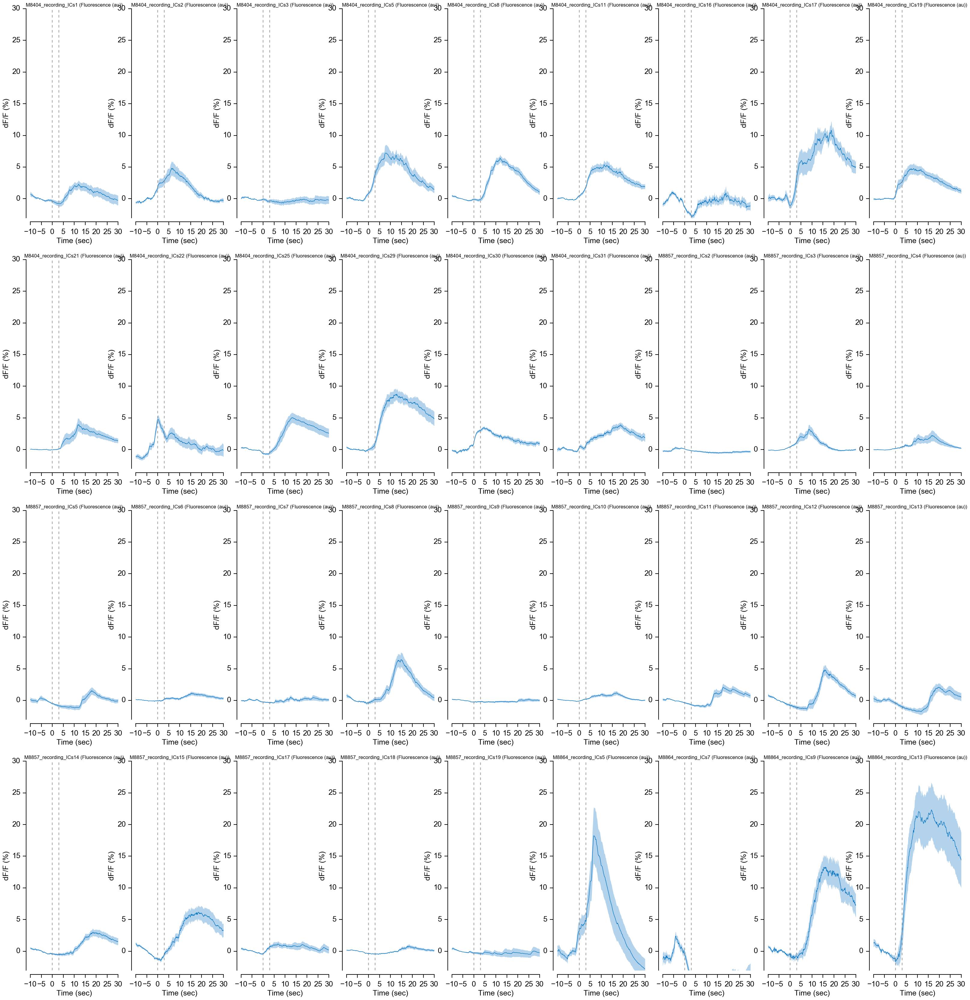

In [9]:
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(base,duration,fs)

# Start running the analysis
#boutMeansFR1 = getBoutMeans(mice, eventType=['Eat_Start', 'Eat_End'], behType=behType, trials=trials, dff=True, baseline=False, base=base)

row = 4
fig = plt.figure(figsize=(40,40), facecolor="w", dpi= 150)
for ind, cell in enumerate(cellNames):
    df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
    semCell = df.loc[cell].sem(axis=0)
    meanCell = df.loc[cell].mean(axis=0)
    
    plt.style.use('classic')
    # Set the font dictionaries (for plot title and axis titles)
    font = {'sans-serif' : 'Arial',
            'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)

    line = 1.5
    colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')
    
    ax = plt.subplot(row, len(cellNames)/row, ind+1)
    
    ## labels
    ax.set_xlabel("Time (sec)")
    ax.set_ylabel("dF/F (%)")
    #title = "Cell: " + cell + "\n" + "Class: " + statsFR1['Class'].loc[cell]
    ax.set_title(cell, fontsize= 12)

    ## Remove top axes and right axes ticks
    ax.get_xaxis().tick_top()
    ax.get_yaxis().tick_left()

    ## adjust the spines and ticks
    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.spines['left'].set_linewidth(line)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_linewidth(line)
    ax.spines['bottom'].set_position(('outward', 10))
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')

    ## decorate the axes
    ax.tick_params(axis='y', color= '#000000', width= line, direction='out', length= 8, which='major', pad=10)
    ax.tick_params(axis='x', color= '#000000', width= line, direction='out', length= 8, which='major', pad=12)

    ax.fill_between(time, meanCell+semCell, meanCell-semCell, facecolor=colors[1], linewidth=0, alpha=0.3, zorder=-5)
    cat, = ax.plot(time, meanCell, colors[1], label=eventType)    
    
    # limits
    lims = [-3, 30]
    ax.set_ylim(lims)
    
    ax.plot([0, 0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
    ax.plot([3.0, 3.0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)

if save:
    fig.savefig("J:\\Hakan Kucukdereli\\Miniscope_Behaviour_MPIN\\scripts\\figures\\first_draft\\all_cells\\5_eat_start_all_cells_means_10sec.svg")

C:\Anaconda2\lib\site-packages\matplotlib\pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


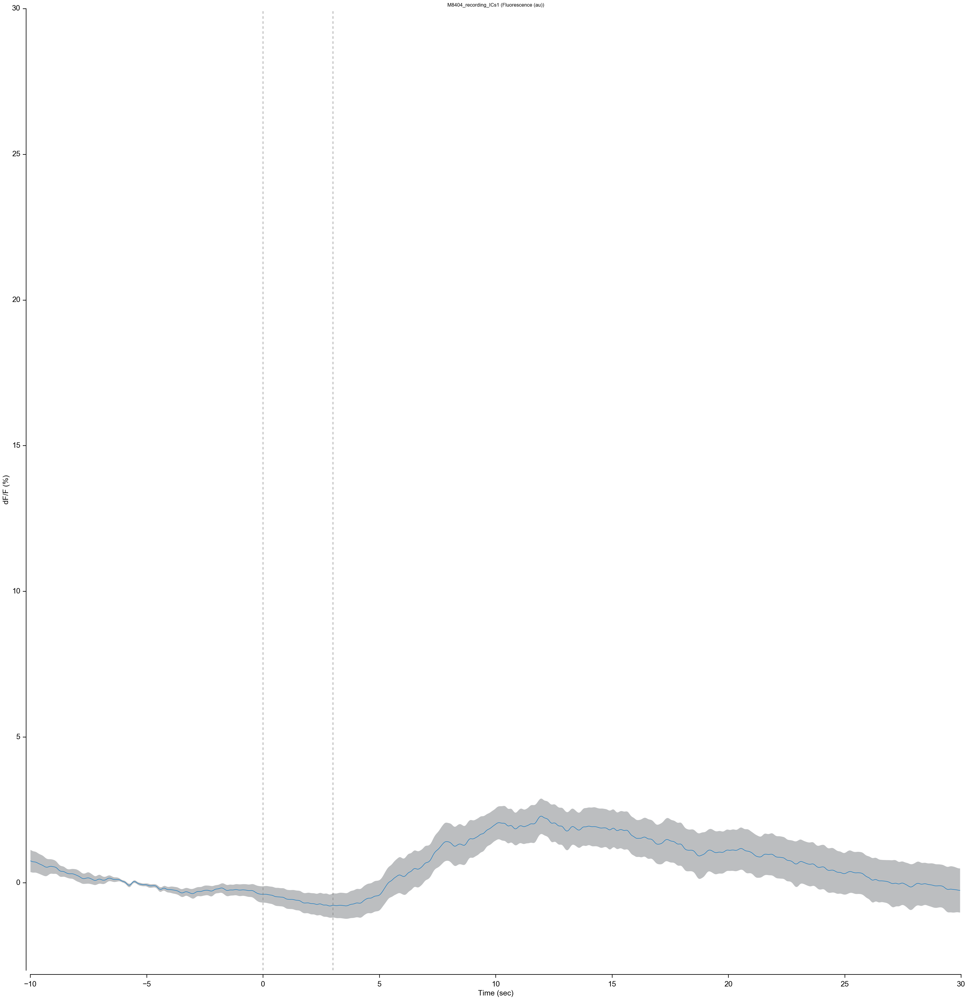

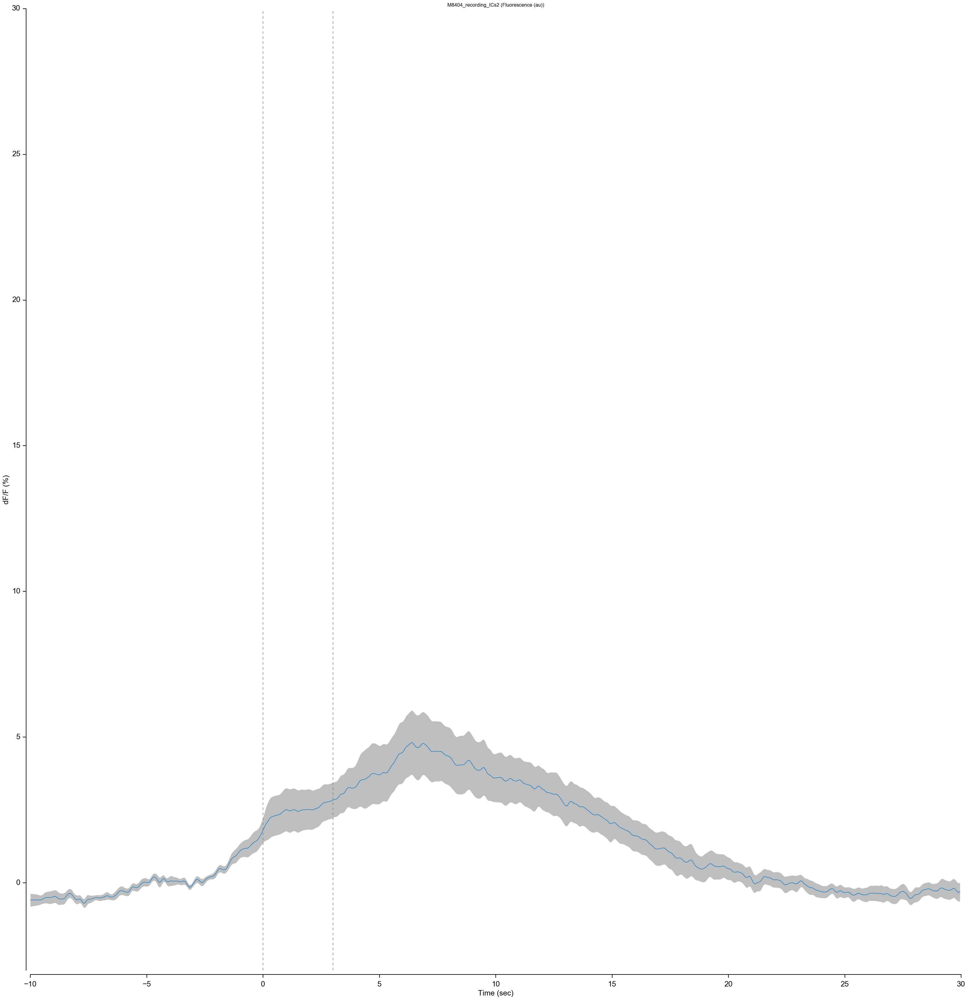

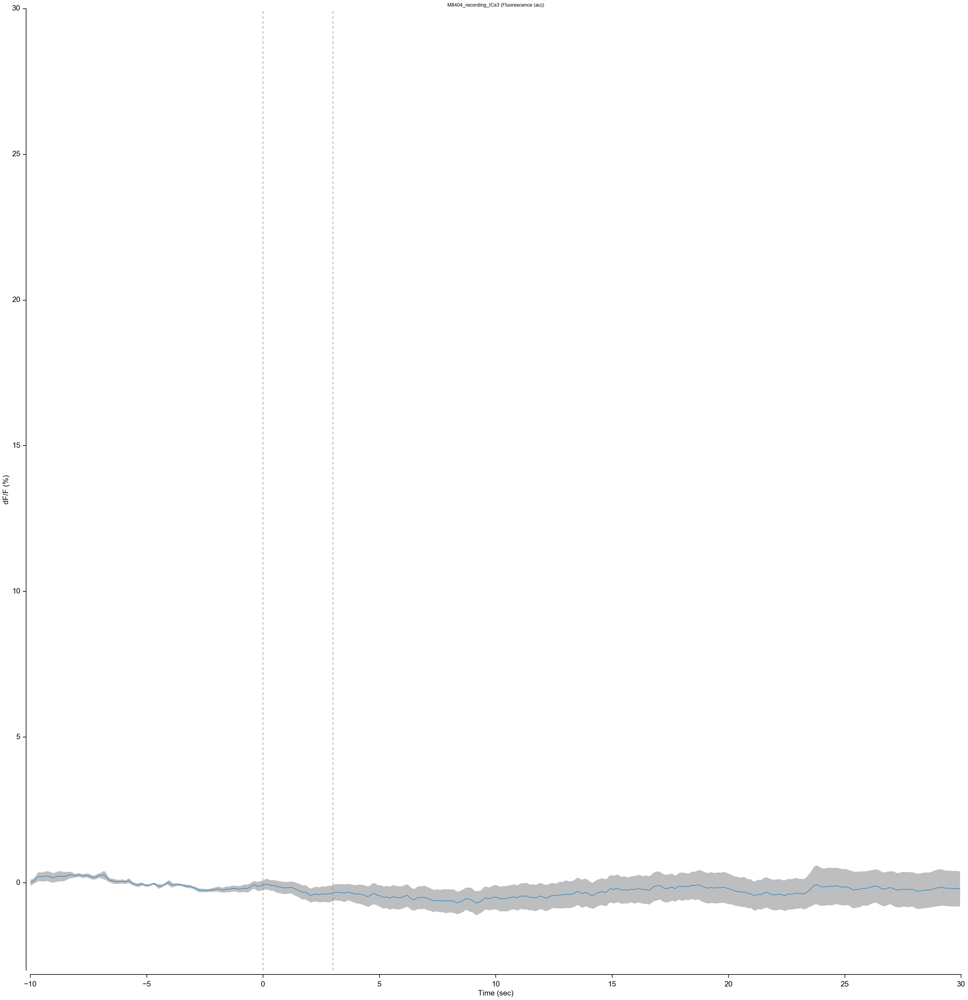

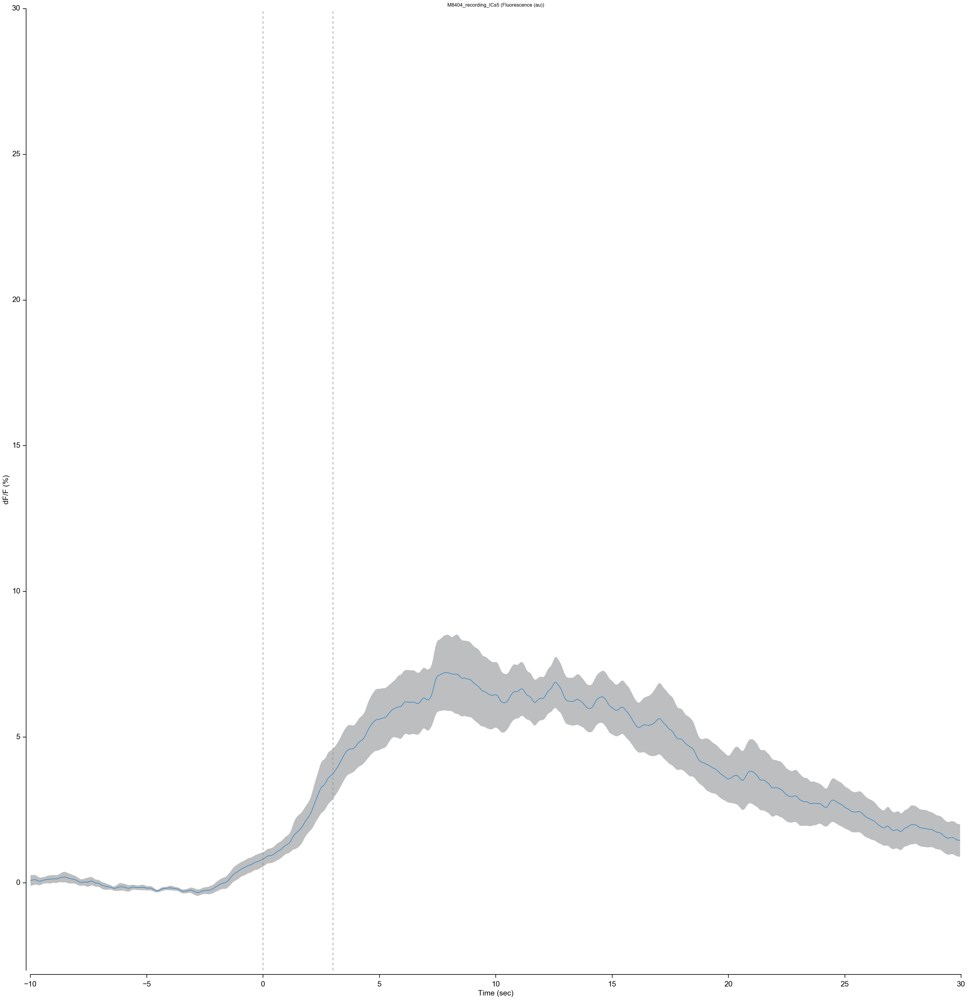

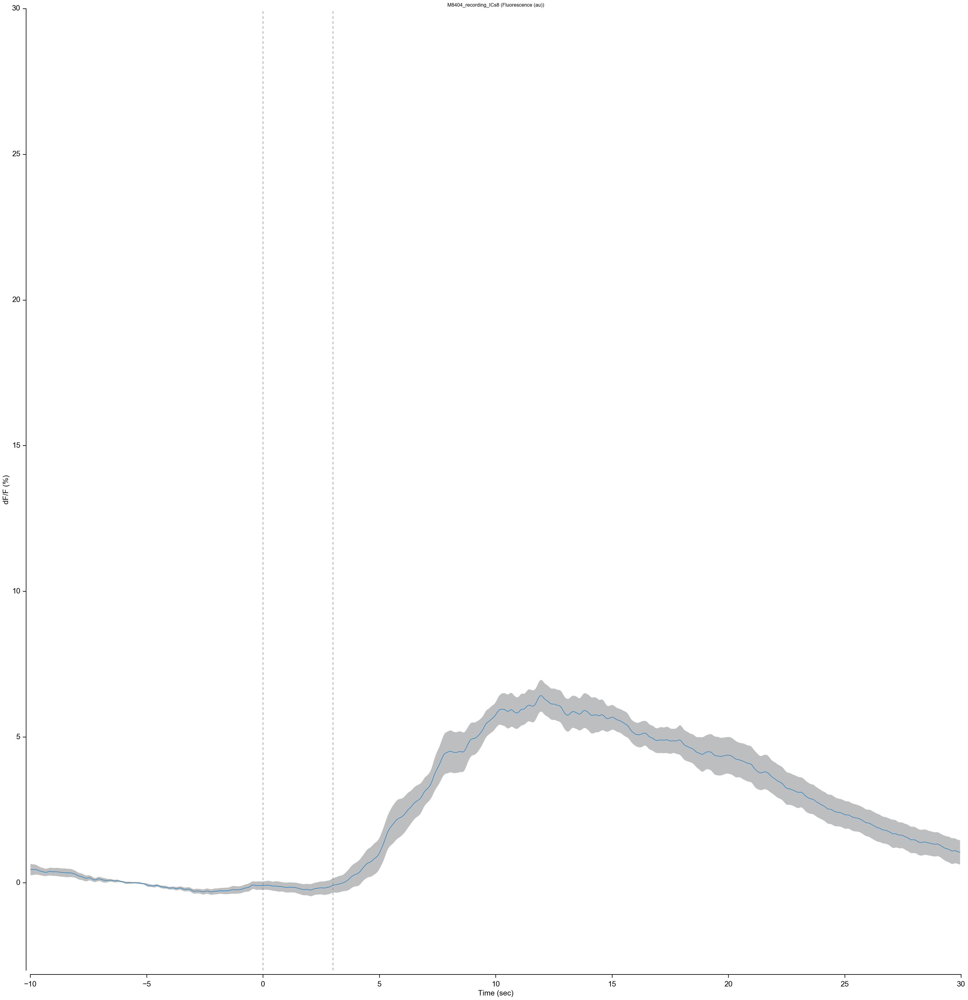

...

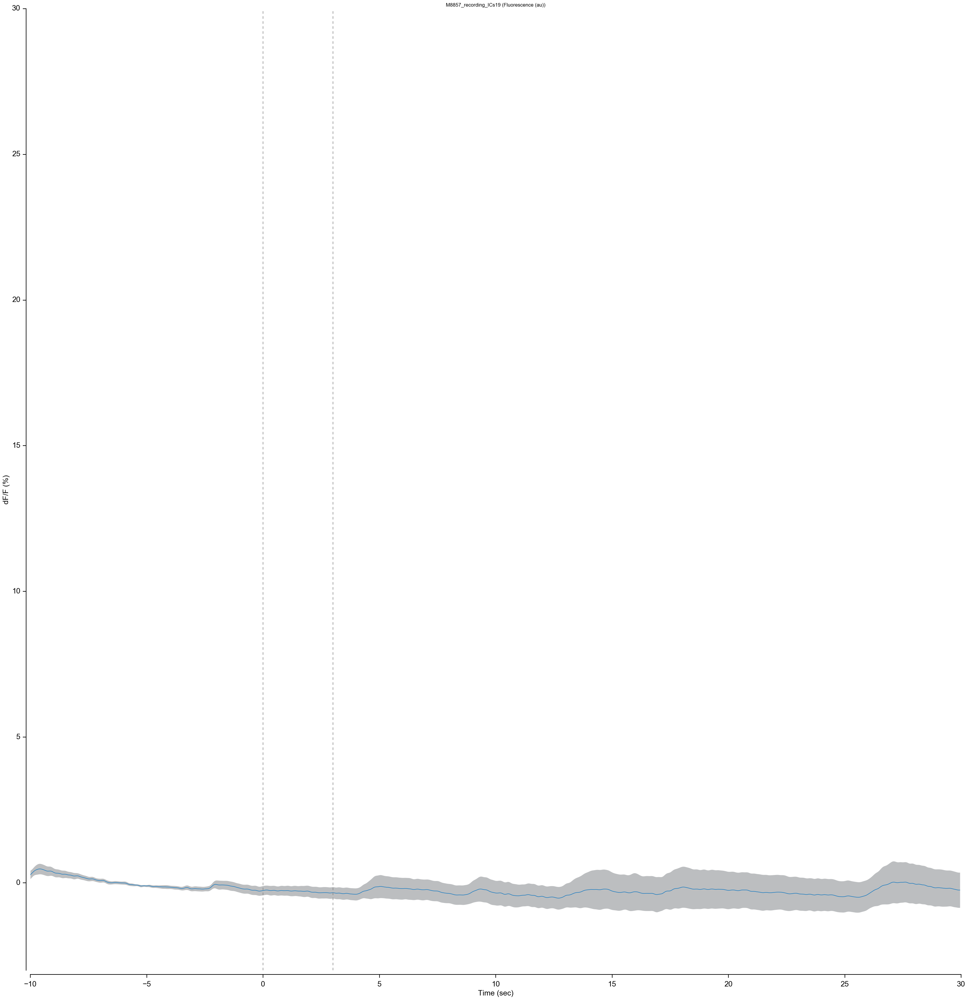

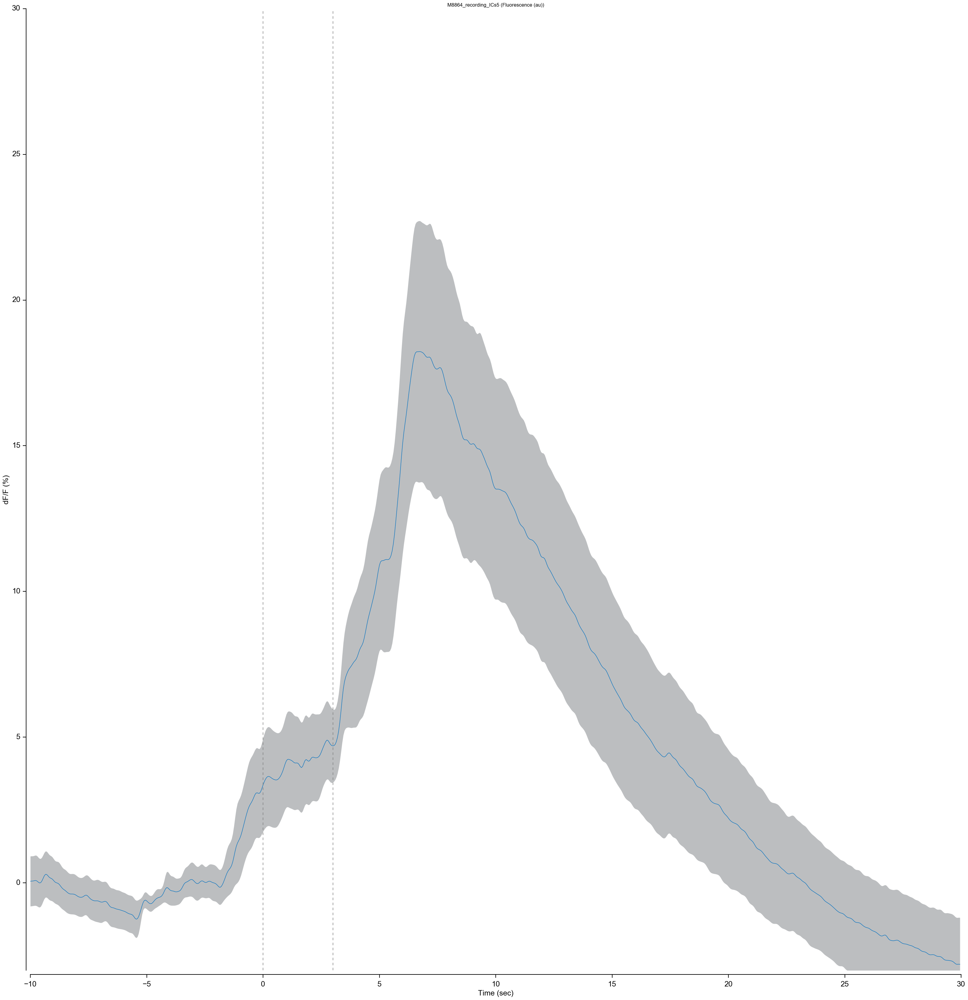

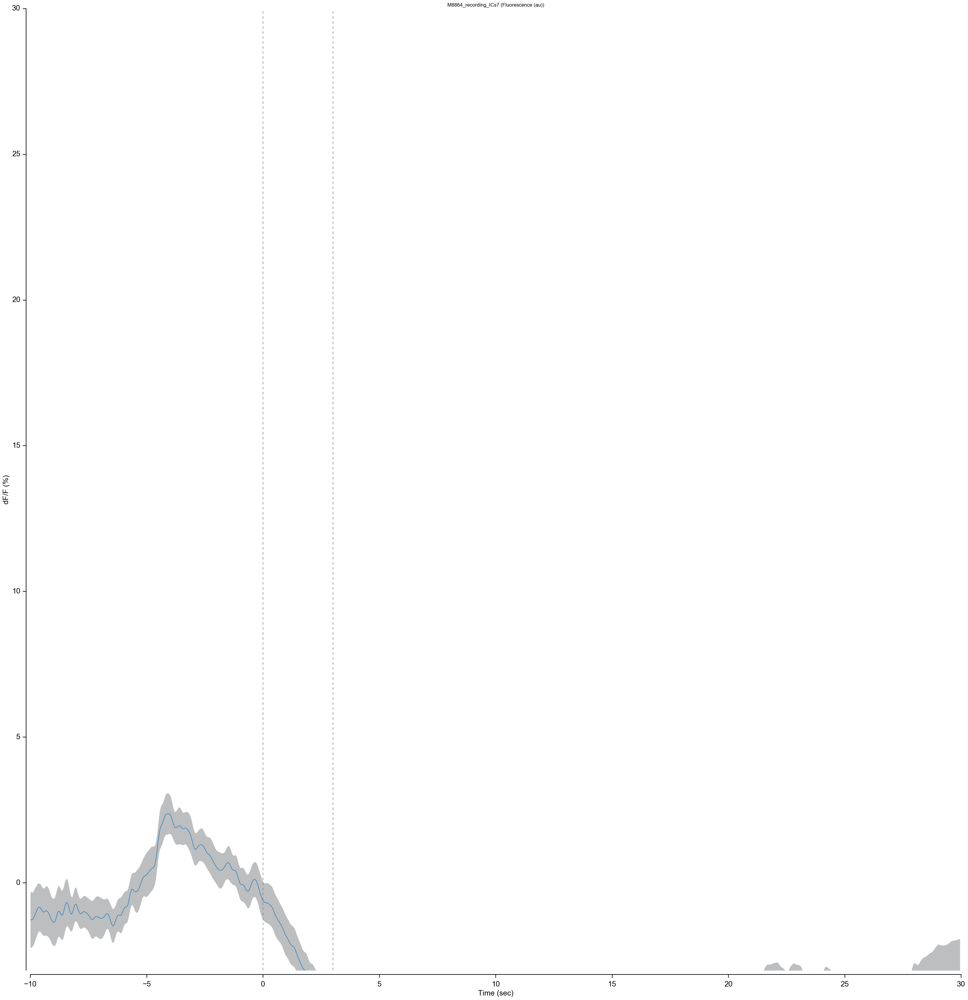

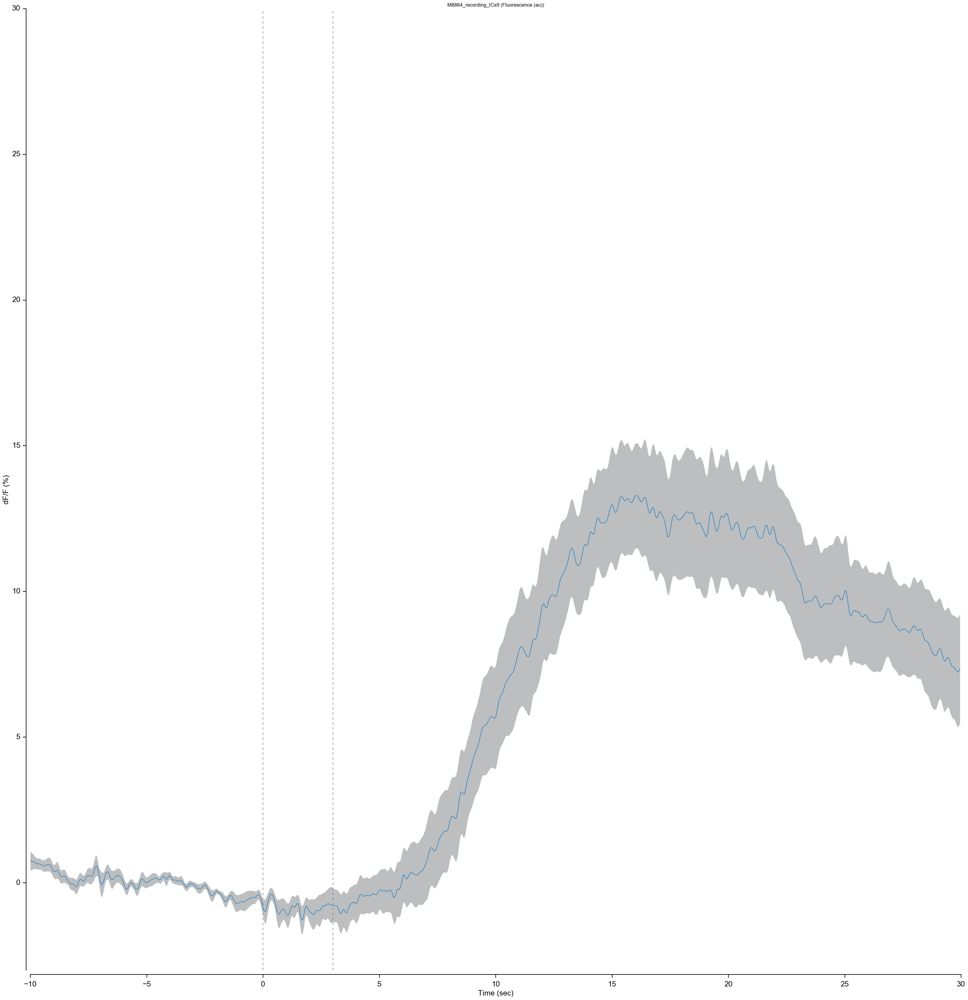

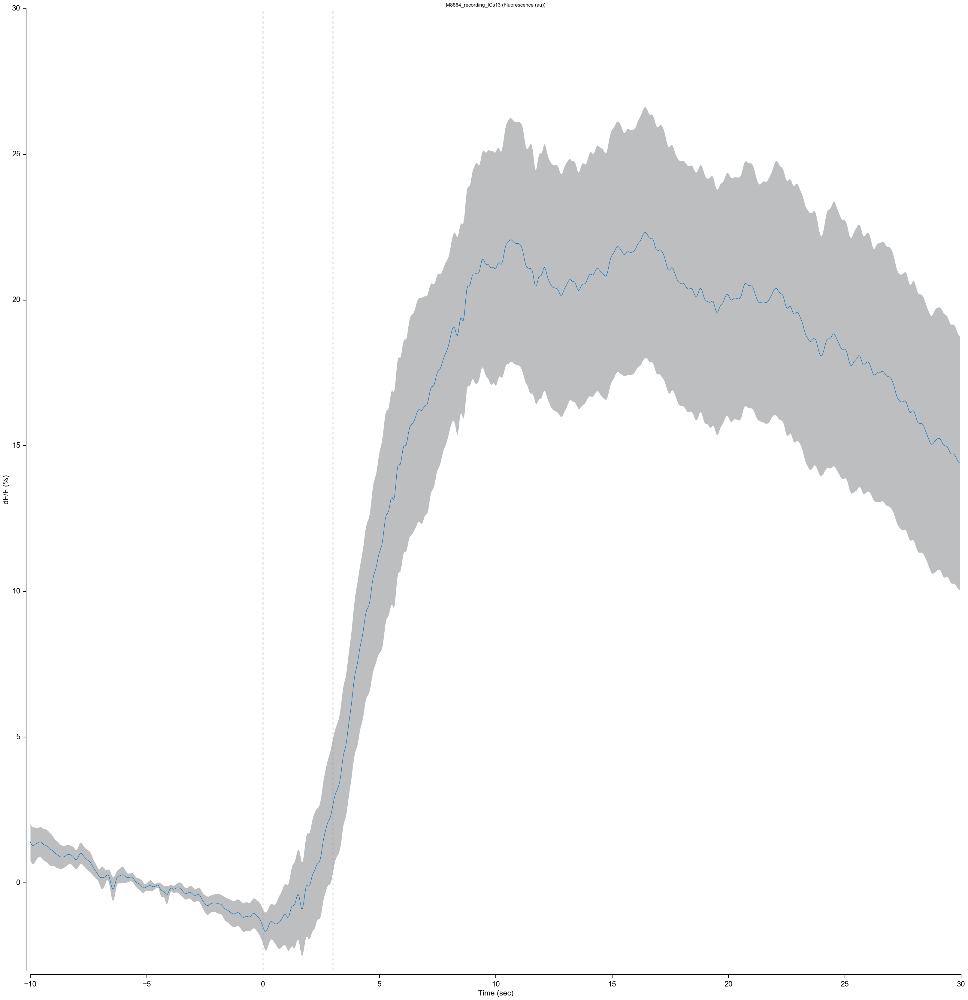

In [10]:
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(base,duration,fs)

# Start running the analysis
#boutMeansFR1 = getBoutMeans(mice, eventType=['Eat_Start', 'Eat_End'], behType=behType, trials=trials, dff=True, baseline=False, base=base)

for ind, cell in enumerate(cellNames):
    fig = plt.figure(figsize=(40,40), facecolor="w", dpi= 150)
    
    df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
    semCell = df.loc[cell].sem(axis=0)
    meanCell = df.loc[cell].mean(axis=0)
    
    plt.style.use('classic')
    # Set the font dictionaries (for plot title and axis titles)
    font = {'sans-serif' : 'Arial',
            'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)

    line = 1.5
    colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')
    
    ax = plt.subplot(111)
    
    ## labels
    ax.set_xlabel("Time (sec)")
    ax.set_ylabel("dF/F (%)")
    #title = "Cell: " + cell + "\n" + "Class: " + statsFR1['Class'].loc[cell]
    ax.set_title(cell, fontsize= 12)

    ## Remove top axes and right axes ticks
    ax.get_xaxis().tick_top()
    ax.get_yaxis().tick_left()

    ## adjust the spines and ticks
    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.spines['left'].set_linewidth(line)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_linewidth(line)
    ax.spines['bottom'].set_position(('outward', 10))
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')

    ## decorate the axes
    ax.tick_params(axis='y', color= '#000000', width= line, direction='out', length= 8, which='major', pad=10)
    ax.tick_params(axis='x', color= '#000000', width= line, direction='out', length= 8, which='major', pad=12)

    ax.fill_between(time, meanCell+semCell, meanCell-semCell, facecolor=colors[0], linewidth=0, alpha=1.0, zorder=-5)
    cat, = ax.plot(time, meanCell, colors[1], label=eventType)    
    
    # limits
    lims = [-3, 30]
    ax.set_ylim(lims)
    
    ax.plot([0, 0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
    ax.plot([3.0, 3.0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
    
    fname = "J:\\Hakan Kucukdereli\\Miniscope_Behaviour_MPIN\\scripts\\for Amelia\\all_cells_2\\5_means_"+cell+"_"+eventType+".svg"
    if save:
        fig.savefig(fname)

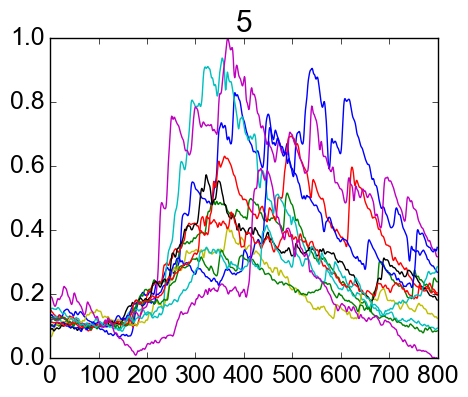

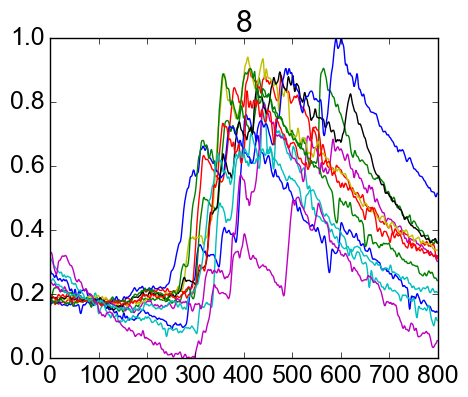

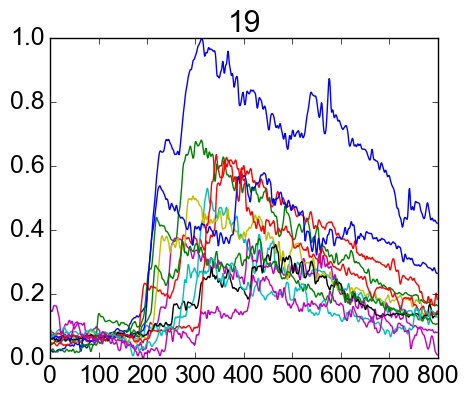

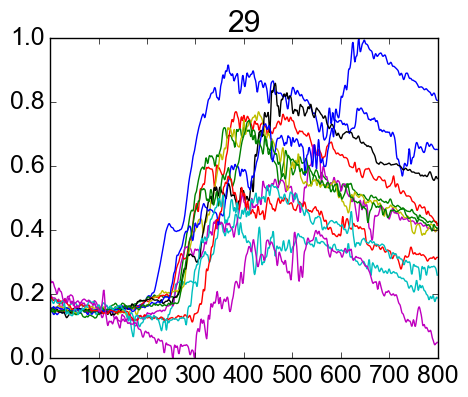

In [11]:
# Plot traces for selected cells
for n in [5,8,19,29]:
    cellname='M8404_recording_ICs'+str(n)+' (Fluorescence (au))'
    
    df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time').loc[cellname].T
    heatdata=(df.values-np.min(np.min(df.values)))/(np.max(np.max(df.values))-np.min(np.min(df.values)))

    fig = plt.figure(figsize=(5,4), facecolor="w", dpi= 150)
    ax = plt.subplot(111)
    for i in np.arange(0,12):
        ax.plot(np.arange(0,800), heatdata.T[i])
    ax.set_title(n)    

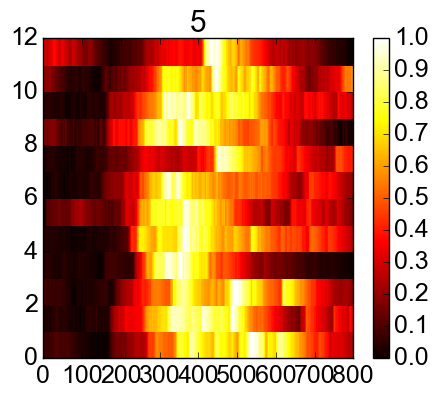

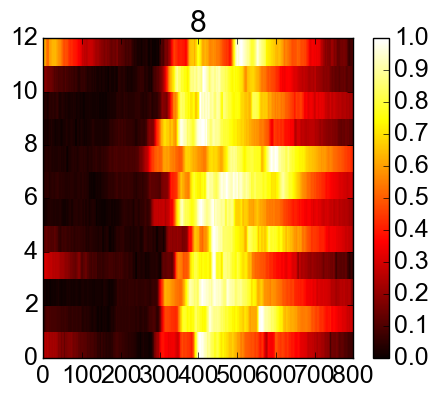

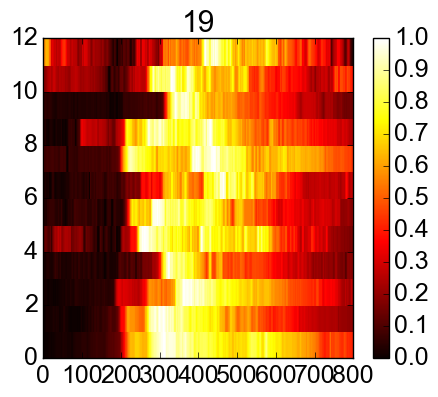

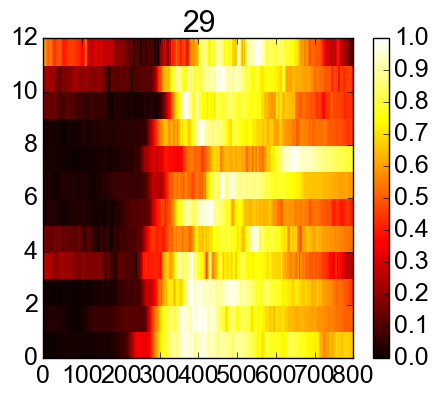

In [13]:
# Plot heatmaps for selected cells 
for n in [5,8,19,29]:
    cellname='M8404_recording_ICs'+str(n)+' (Fluorescence (au))'
    
    df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time').loc[cellname].T
    heatdata=(df.values-np.min(df.values, axis=0))/(np.max(df.values, axis=0)-np.min(df.values, axis=0))

    fig = plt.figure(figsize=(5,4), facecolor="w", dpi= 150)
    ax = plt.subplot(111)
    plt.pcolor(heatdata.T, cmap=plt.cm.hot)
    plt.colorbar()
    ax.set_title(n)  

In [ ]:
# Plot heatmaps for all the individual cells
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(base,duration,fs)
eventsData_norm = markTrials(mice, normList, base=base, duration=duration, eventType=eventType, behType=behType, trials=trials, baselining=False)
heatData = eventsData_norm.pivot_table(index=['Event', 'Cell'], columns='New_Time').values

# Start running the analysis
#boutMeansFR1 = getBoutMeans(mice, eventType=['Eat_Start', 'Eat_End'], behType=behType, trials=trials, dff=True, baseline=False, base=base)

row = 4
fig = plt.figure(figsize=(40,40), facecolor="w", dpi= 150)
for ind, cell in enumerate(cellNames):
    df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
    semCell = df.loc[cell].sem(axis=0)
    meanCell = df.loc[cell].mean(axis=0)
    
    plt.style.use('classic')
    # Set the font dictionaries (for plot title and axis titles)
    font = {'sans-serif' : 'Arial',
            'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)

    line = 1.5
    colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')
    
    ax = plt.subplot(row, len(cellNames)/row, ind+1)
    
    ## labels
    ax.set_xlabel("Time (sec)")
    ax.set_ylabel("dF/F (%)")
    #title = "Cell: " + cell + "\n" + "Class: " + statsFR1['Class'].loc[cell]
    ax.set_title(cell, fontsize= 12)

    ## Remove top axes and right axes ticks
    ax.get_xaxis().tick_top()
    ax.get_yaxis().tick_left()

    ## adjust the spines and ticks
    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.spines['left'].set_linewidth(line)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_linewidth(line)
    ax.spines['bottom'].set_position(('outward', 10))
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')

    ## decorate the axes
    ax.tick_params(axis='y', color= '#000000', width= line, direction='out', length= 8, which='major', pad=10)
    ax.tick_params(axis='x', color= '#000000', width= line, direction='out', length= 8, which='major', pad=12)

    plt.pcolor(heatData, cmap=plt.cm.hot, linewidth=line, linestyle='solid', vmin=0.0, vmax=0.55)
    
    # limits
    lims = [-3, 30]
    ax.set_ylim(lims)
    
    ax.plot([0, 0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
    ax.plot([3.0, 3.0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)

#fig.savefig("J:\\Hakan Kucukdereli\\Miniscope_Behaviour_MPIN\\scripts\\figures\\first_draft\\all_cells\\5_eat_start_all_cells_means_10sec.svg")


3  mice were loaded.
Mouse number 8404  had  15  total rewards.
Mouse number 8857  had  17  total rewards.
Mouse number 8864  had  13  total rewards.


In [ ]:
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(base,duration,fs)
eventsData_norm = markTrials(mice, normList, base=base, duration=duration, eventType=eventType, behType=behType, trials=trials, baselining=False)

In [ ]:
eventsData_norm.pivot_table(index=['Cell', 'Event'], columns='New_Time', values='Fluoro')

In [ ]:
# Start running the analysis
#boutMeansFR1 = getBoutMeans(mice, eventType=['Eat_Start', 'Eat_End'], behType=behType, trials=trials, dff=True, baseline=False, base=base)

for ind, cell in enumerate(cellNames[1:3]):
    fig = plt.figure(figsize=(6,5), facecolor="w", dpi= 150)
    
    df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
    semCell = df.loc[cell].sem(axis=0)
    meanCell = df.loc[cell].mean(axis=0)
    
    plt.style.use('classic')
    # Set the font dictionaries (for plot title and axis titles)
    font = {'sans-serif' : 'Arial',
            'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)

    line = 1.5
    colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')
    
    ax = plt.subplot(111)
    
    ## labels
    ax.set_xlabel('Time (sec)')
    ax.set_ylabel('Trial #')
    ax.set_title(cell, fontsize= 12)


    ## decorate the axes
    time_ax = np.arange(base, duration+0.001, 5.0)
    ax.set_xticks(np.linspace(0, (-base+duration)/fs, len(time_ax)))
    ax.set_xticklabels(time_ax)
    ax.set_yticks(np.linspace(trials[0]-0.5, trials[1]-0.5, 2))
    ax.set_yticklabels(np.linspace(trials[0], trials[1], 2, dtype=int))
    
    heatData = eventsData_norm.pivot_table(index=['Cell', 'Event'], columns='New_Time', values='Fluoro').loc[cell]
    plt.pcolor(heatData, cmap=plt.cm.PiYG_r, linewidth=line, linestyle='solid', vmin=0.0, vmax=1.0)
    plt.colorbar()
   
    #ax.plot([0, 0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
    #ax.plot([3.0, 3.0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
    ax.plot([-base/fs, -base/fs], list(ax.get_ylim()), 'w', linestyle='--', linewidth=line*1.2, alpha=1., zorder=111)
    
    fname = "J:\\Hakan Kucukdereli\\Miniscope_Behaviour_MPIN\\scripts\\figures\\first_draft\\all_cells\\6_means_"+cell+eventType+".svg"
    fig.savefig(fname)